In [11]:
from datasets import get_model_datasets, get_model_data_loaders
from collections import Counter
import torchvision
import matplotlib.pyplot as plt
import numpy as np

In [12]:
def imshow(inp, title=None, ax=None, figsize=(5, 5)):
  """Imshow for Tensor."""
  inp = inp.numpy().transpose((1, 2, 0))
  #mean = np.array([0.485, 0.456, 0.406])
  #std = np.array([0.229, 0.224, 0.225])
  #inp = std * inp + mean
  #inp = np.clip(inp, 0, 1)
  if ax is None:
    fig, ax = plt.subplots(1, figsize=figsize)
  ax.imshow(inp)
  ax.set_xticks([])
  ax.set_yticks([])
  if title is not None:
    ax.set_title(title)

In [13]:
train_sampler, valid_sampler,dataset_classes=get_model_datasets()
print(train_sampler)
print()
print(valid_sampler)
print(dataset_classes)
 


['agouti', 'collared_peccary', 'common_opossum', 'european_hare', 'ocelot', 'paca', 'red_brocket_deer', 'red_fox', 'red_squirrel', 'roe_deer', 'spiny_rat', 'white-nosed_coati', 'white_tailed_deer', 'wild_boar']


In [31]:
from torchvision import transforms, datasets
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF
ROOT_DIR = '/LUSTRE/users/ecoinf_admin/conabio_ml_vision/examples/classification/missouri/missouri_new_files/split_crop_images/train'
VALID_SPLIT = 0.1 #10% of training data
IMAGE_SIZE = 580 # Image size of resize when applying transforms. #probar con 224
BATCH_SIZE = 32 
NUM_WORKERS = 0 # Number of parallel processes for data preparation.
NUM_CALIB = 100 # esto debe de calcularse mejor como una proporcion
class MyEqualizerTransform:
    """Rotate by one of the given angles."""

    def __init__(self, arg1=None): 
        self.__arg1 = arg1

    def __call__(self, x):
        return TF.equalize(x)

# Training trasnforms
def get_train_transform():
    transform = transforms.Compose([
        transforms.Resize((IMAGE_SIZE,IMAGE_SIZE)),
        transforms.RandomHorizontalFlip(p=0.5),
        MyEqualizerTransform(),
        transforms.RandomAdjustSharpness(sharpness_factor=2, p=0.5),
        transforms.ColorJitter(brightness=.3,contrast=0.5,saturation=0.59,hue=.3),
        transforms.ToTensor(),
        transforms.RandomApply(transforms=
                               [
                                #transforms.Normalize([0.3768, 0.3809, 0.3522],[0.1951,0.1968,0.1943])
                                transforms.Normalize([0.485, 0.456, 0.406],[0.229, 0.224, 0.225])
                               ], p=1)
            ])
    return transform

def get_valid_transform():
    transform = transforms.Compose([
        transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        #transforms.RandomApply(transforms=[transforms.Normalize([0.3768, 0.3809, 0.3522],[0.1951,0.1968,0.1943])], p=0.6)
    ])
    return transform

In [32]:
dataset = datasets.ImageFolder(
        ROOT_DIR, 
        transform=(get_train_transform())
    )

In [33]:
train_loader = torch.utils.data.DataLoader(dataset, batch_size=BATCH_SIZE, 
                                           sampler=train_sampler,num_workers=NUM_WORKERS)

In [34]:
dataset_valid = datasets.ImageFolder(
        ROOT_DIR, 
        transform=(get_valid_transform())
    )

In [35]:
valid_loader = torch.utils.data.DataLoader(dataset_valid, batch_size=BATCH_SIZE, 
                                            sampler=valid_sampler,num_workers=NUM_WORKERS)

In [43]:
for i, (x, target) in enumerate(valid_loader):
    print("x",x.shape)
    print()
    print(target)
    print(target.shape)

x torch.Size([32, 3, 580, 580])

tensor([ 9, 11,  8,  3,  5,  1,  4,  8,  7, 12, 12,  5, 11,  2,  1, 11,  7, 11,
        13, 13,  8,  9, 13,  2,  5, 13,  9,  9, 11, 13,  0,  0])
torch.Size([32])
x torch.Size([32, 3, 580, 580])

tensor([ 8,  9,  0,  8,  4,  5, 13,  9,  0, 10,  9,  3,  9,  3,  7,  5,  4, 11,
         3, 12, 12, 10, 12,  6, 12,  6,  6,  3,  3,  6, 11,  6])
torch.Size([32])
x torch.Size([32, 3, 580, 580])

tensor([ 1,  9,  5,  0,  2, 12,  7, 11,  7,  7,  1,  6, 12, 13,  0,  1,  4,  9,
         8,  0, 13, 11,  5,  5,  1, 10,  4,  1,  4, 10, 10, 10])
torch.Size([32])
x torch.Size([32, 3, 580, 580])

tensor([ 0, 10,  0,  9,  1,  1,  2,  7, 11,  8,  7,  3,  4,  6, 12,  6, 12,  8,
         9,  2, 13,  4,  2,  6, 13,  7, 10, 10,  2,  8,  3,  4])
torch.Size([32])
x torch.Size([17, 3, 580, 580])

tensor([ 0,  7,  3,  2,  5,  8,  2, 10,  4,  5, 11,  6,  2,  3, 13,  1,  5])
torch.Size([17])


In [66]:
target = torch.tensor([13,2])
print(target.shape)
pred = torch.tensor([[ 8,  2,  0, 11,  9],[ 8,  2,  0, 11,  9]]).t()
print(pred.shape)
correct = pred.eq(target.view(1, -1).expand_as(pred))

torch.Size([2])
torch.Size([5, 2])


In [67]:
target.view(1, -1).expand_as(pred)

tensor([[13,  2],
        [13,  2],
        [13,  2],
        [13,  2],
        [13,  2]])

In [68]:
pred

tensor([[ 8,  8],
        [ 2,  2],
        [ 0,  0],
        [11, 11],
        [ 9,  9]])

In [69]:
correct

tensor([[False, False],
        [False,  True],
        [False, False],
        [False, False],
        [False, False]])

In [71]:
k=5
correct_k = correct[:k].float().sum()
correct_k

tensor(1.)

In [40]:
print(len(valid_sampler))
print(len(train_sampler))

145
1305


In [37]:
inputs, classes = next(iter(train_loader))
out = torchvision.utils.make_grid(inputs, nrow=5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 3, 580, 580])


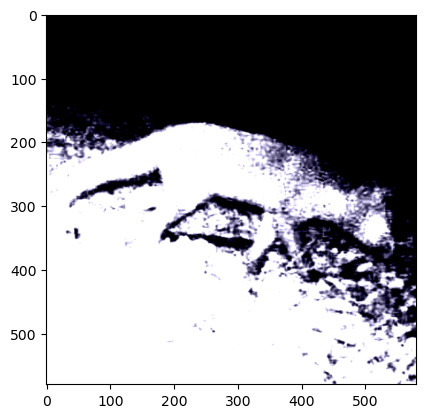

In [38]:
print(inputs.shape)
tensor_image = inputs[1]
plt.imshow(tensor_image.permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


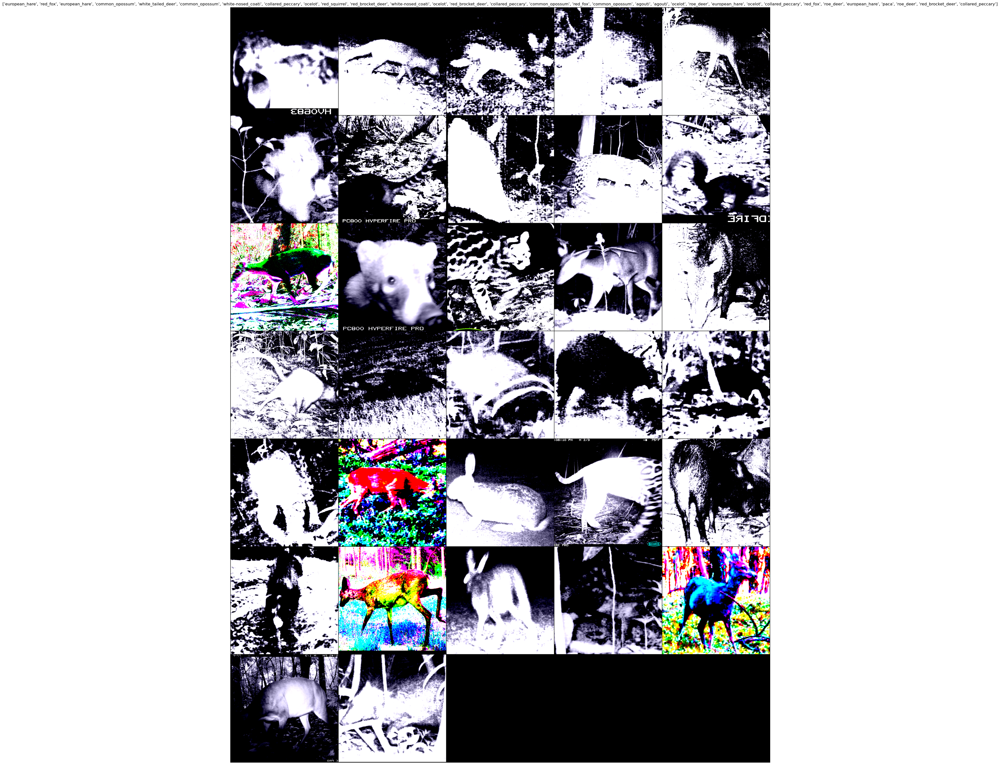

In [39]:
fig, ax = plt.subplots(1, figsize=(40, 40))
imshow(out, title=[dataset_classes[x] for x in classes], ax=ax)

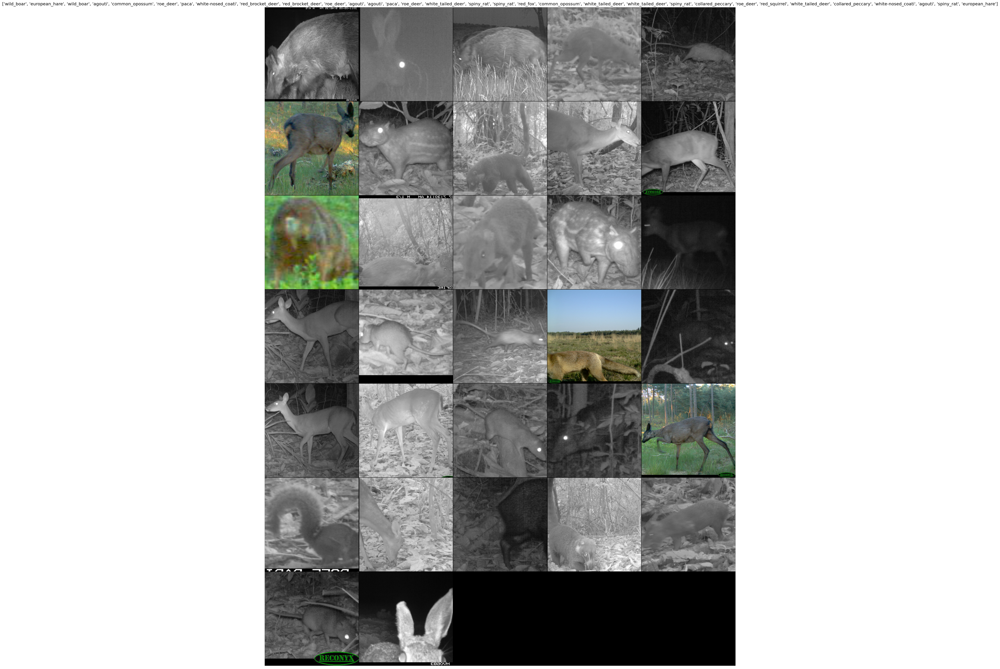

In [76]:
inputs, classes = next(iter(valid_loader))
out = torchvision.utils.make_grid(inputs, nrow=5)
fig, ax = plt.subplots(1, figsize=(40, 40))
imshow(out, title=[dataset_classes[x] for x in classes], ax=ax)

In [9]:
from utils import get_model
model = get_model(modelname='efficientnet_b0', pretrained=False)

In [77]:
#model

In [1]:
MODEL_PATH = '/LUSTRE/users/ecoinf_admin/conabio_ml_vision/examples/classification/missouri/classifier_model_files/model.pth'

In [2]:
import torch
import torch.nn as nn
pretrained_weights = torch.load(MODEL_PATH) 

In [3]:
pretrained_weights.keys()

dict_keys(['epoch', 'model_state_dict', 'optimizer_state_dict', 'loss'])

In [6]:
pretrained_weights['epoch']

40

In [29]:
#pretrained_weights['model_state_dict'].keys()
num_ftrs = model.classifier[1].in_features
model.classifier[1] = nn.Linear(
in_features=num_ftrs, out_features=14)

In [30]:
model.load_state_dict(pretrained_weights['model_state_dict'])

<All keys matched successfully>

In [38]:
import numpy as np

argsort=np.argsort([0.055,.01,0.7,.045,.04,0.1])
print(argsort)
#argsort.flip(dims=(0,))
np.flip(argsort,(0,))

[1 4 3 0 5 2]


array([2, 5, 0, 3, 4, 1])

In [39]:
arr=np.flip(argsort,(0,))

np.where(arr==5)[0][0]

1

In [59]:
preds = np.array([[0.055,.01,0.7,.045,.04,0.1],
                  [0.6,.01,0.019,.2,.017,0.154],
                  [0.8,.01,0.02,.05,.08,0.04]])
print(np.flip(np.argsort([0.055,.01,0.7,.045,.04,0.1]),(0,)))
print(np.flip(np.argsort([0.6,.01,0.019,.2,.017,0.154]),(0,)))
print(np.flip(np.argsort([0.8,.01,0.02,.05,.08,0.04]),(0,)))
real=[5,0,1]
#[cabra,conejo,meduza,perro,gato,loro]
# real=5 quiere decir que es la etiqueta correcta
#array([2, 5, 0, 3, 4, 1]) la prediccion nos dice que la etiqueta es 2 pero 5 es la correcta
#entonces vamos a contar hasta cuantos debemos incluir para ver nuestra etiqueta correcta

[2 5 0 3 4 1]
[0 3 5 2 4 1]
[0 4 3 5 2 1]


In [61]:
get_locs_kstar = np.array([np.where(np.flip(np.argsort(pred),(0,)) == rl)[0][0] for pred,rl in zip(preds,real)])

In [63]:
k_star = np.quantile(get_locs_kstar,0.95)+1
k_star

5.6

In [79]:
#verificar como se ve esto
for i, (x, target) in enumerate(train_loader):
    print(x.shape)
    print(target.shape)
    

torch.Size([32, 3, 580, 580])
torch.Size([32])
torch.Size([32, 3, 580, 580])
torch.Size([32])
torch.Size([32, 3, 580, 580])
torch.Size([32])
torch.Size([32, 3, 580, 580])
torch.Size([32])
torch.Size([32, 3, 580, 580])
torch.Size([32])
torch.Size([32, 3, 580, 580])
torch.Size([32])
torch.Size([32, 3, 580, 580])
torch.Size([32])
torch.Size([32, 3, 580, 580])
torch.Size([32])
torch.Size([32, 3, 580, 580])
torch.Size([32])
torch.Size([32, 3, 580, 580])
torch.Size([32])
torch.Size([32, 3, 580, 580])
torch.Size([32])
torch.Size([32, 3, 580, 580])
torch.Size([32])
torch.Size([32, 3, 580, 580])
torch.Size([32])
torch.Size([32, 3, 580, 580])
torch.Size([32])
torch.Size([32, 3, 580, 580])
torch.Size([32])
torch.Size([32, 3, 580, 580])
torch.Size([32])
torch.Size([32, 3, 580, 580])
torch.Size([32])
torch.Size([32, 3, 580, 580])
torch.Size([32])
torch.Size([32, 3, 580, 580])
torch.Size([32])
torch.Size([32, 3, 580, 580])
torch.Size([32])
torch.Size([32, 3, 580, 580])
torch.Size([32])
torch.Size([3

In [80]:
target.size(0)

25

In [ ]:
# ver como se hace esta inferencia 
for i, (x, target) in enumerate(val_loader):
            target = target.cuda()
            # compute output
            output, S = model(x.cuda())

https://stackoverflow.com/questions/62476547/how-is-data-augmentation-done-in-each-epoch